In [1]:
library(qiime2R)
library(tidyr)
library(tibble)
library(ggplot2)
library(phyloseq)
#library(biome)
library(phyloseq)
#library(metagenomeSeq)
library(tibble)
library(ANCOMBC)
library("tidyverse")

── Attaching packages ────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.1 ──

✔ readr   2.1.2     ✔ stringr 1.4.0
✔ purrr   0.3.4     ✔ forcats 0.5.1
✔ dplyr   1.0.8     

── Conflicts ───────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



In [2]:
# Read in the 16S qza files and clean them up for phyloseq
ASVtable_16S <- read_qza("/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/QiimeOutPut/tableV_BacArc_merge_SCTLD.qza")
ASVtable_16S <- ASVtable_16S$data # Extract the count data from list
ASVtaxa_16S <- read_qza("/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/QiimeOutPut/taxaVsearch_rep_merge_SCTLD.qza")
taxtable_16S <- ASVtaxa_16S$data %>% as_tibble() %>% separate(Taxon, sep=";",
c("Kingdom", "Phylum", "Class", "Order", "Family", "Genus", "Species"))  %>% 
unite("Taxa", Family:Genus, remove = FALSE) %>% arrange(Feature.ID) %>% mutate(ASV = 1:n()) %>% 
mutate(newcol = "ASV") %>%
unite("ASVs", newcol:ASV) 
# Convert taxonomy info to data frame with correct taxonomy labels
taxtable_16S <- taxtable_16S[-1,]
#asv_tab$asv_id <- rownames(asv_tab) # add a new column for ids
sample_info_tab_16S <- read.csv("/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/metadata_for_qiime/SCTLD_meta_analysis_metadata.csv", header = T, row.names = 1,
na.strings = c("", "NA"))


Warning message:
“Expected 7 pieces. Missing pieces filled with `NA` in 80037 rows [1, 2, 10, 13, 16, 19, 21, 24, 27, 29, 30, 38, 40, 41, 42, 44, 46, 48, 52, 54, ...].”


In [6]:
head(taxtable_16S)

Feature.ID,Kingdom,Phylum,Class,Order,Taxa,Family,Genus,Species,Consensus,ASVs
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>
00009f8c782556f942f2c23c59ed14c8,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Cytophagales,f__Cyclobacteriaceae_ g__uncultured,f__Cyclobacteriaceae,g__uncultured,NA,1.0000000,ASV_2
0000ef72f9fb70069e941768873a1f83,d__Bacteria,p__Planctomycetota,c__Planctomycetes,o__Pirellulales,f__Pirellulaceae_ g__Rubripirellula,f__Pirellulaceae,g__Rubripirellula,s__uncultured_bacterium,1.0000000,ASV_3
00015cb0a8036853e41c83406c9c8b9a,d__Bacteria,p__Campilobacterota,c__Campylobacteria,o__Campylobacterales,f__Arcobacteraceae_ g__Halarcobacter,f__Arcobacteraceae,g__Halarcobacter,s__uncultured_Epsilonproteobacteria,0.6666667,ASV_4
0001655af495dcea6b17d2dc45818d37,d__Bacteria,p__Planctomycetota,c__Planctomycetes,o__Pirellulales,f__Pirellulaceae_ g__Pir4_lineage,f__Pirellulaceae,g__Pir4_lineage,s__uncultured_bacterium,0.6666667,ASV_5
000181cd02e8c8ccf196710b55e5363d,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhizobiales,f__Rhizobiaceae_ g__Aureimonas,f__Rhizobiaceae,g__Aureimonas,NA,0.6666667,ASV_6
0001eda9fed75269a1842a56da3d20a0,d__Bacteria,p__WPS-2,c__WPS-2,o__WPS-2,f__WPS-2_ g__WPS-2,f__WPS-2,g__WPS-2,s__uncultured_bacterium,0.6666667,ASV_7


In [3]:
physeq_16S <- phyloseq(otu_table(ASVtable_16S, taxa_are_rows= T),
tax_table(as.data.frame(taxtable_16S) %>% column_to_rownames("Feature.ID") %>%
as.matrix()), sample_data(sample_info_tab_16S))
physeq_16S
#taxa_names(physeq_16S) <- paste0("ASV", seq(ntaxa(physeq_16S)))

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 151861 taxa and 2003 samples ]
sample_data() Sample Data:       [ 2003 samples by 59 sample variables ]
tax_table()   Taxonomy Table:    [ 151861 taxa by 10 taxonomic ranks ]

In [8]:
sub_samples = c("TissueSlurry", "Mucus", "TissueSlurry_Skeleton", "Seawater", "Sediment")

sub_samples2 = c("TissueSlurry", "Mucus", "TissueSlurry_Skeleton")

ps =subset_samples(physeq_16S, sample_type %in% sub_samples)
ps

ps = filter_taxa(ps, function(x) sum(x > 20) > (0.015*length(x)), TRUE)
ps
  
                 
ps.coral_TL =subset_samples(physeq_16S, sample_type %in% sub_samples2 & tissue_type=="DL")
ps.coral_TL             
                 
ps.coral_TL = filter_taxa(ps.coral_TL, function(x) sum(x > 20) > (0.020*length(x)), TRUE)
ps.coral_TL              



phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 151861 taxa and 1948 samples ]
sample_data() Sample Data:       [ 1948 samples by 59 sample variables ]
tax_table()   Taxonomy Table:    [ 151861 taxa by 10 taxonomic ranks ]

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 2834 taxa and 1948 samples ]
sample_data() Sample Data:       [ 1948 samples by 59 sample variables ]
tax_table()   Taxonomy Table:    [ 2834 taxa by 10 taxonomic ranks ]

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 151861 taxa and 571 samples ]
sample_data() Sample Data:       [ 571 samples by 59 sample variables ]
tax_table()   Taxonomy Table:    [ 151861 taxa by 10 taxonomic ranks ]

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 2172 taxa and 571 samples ]
sample_data() Sample Data:       [ 571 samples by 59 sample variables ]
tax_table()   Taxonomy Table:    [ 2172 taxa by 10 taxonomic ranks ]

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 151861 taxa and 2002 samples ]
sample_data() Sample Data:       [ 2002 samples by 59 sample variables ]
tax_table()   Taxonomy Table:    [ 151861 taxa by 10 taxonomic ranks ]

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 151861 taxa and 53 samples ]
sample_data() Sample Data:       [ 53 samples by 59 sample variables ]
tax_table()   Taxonomy Table:    [ 151861 taxa by 10 taxonomic ranks ]

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 151861 taxa and 393 samples ]
sample_data() Sample Data:       [ 393 samples by 59 sample variables ]
tax_table()   Taxonomy Table:    [ 151861 taxa by 10 taxonomic ranks ]

In [9]:
out = ancombc(phyloseq = ps.coral.TS, formula = "species_code", 
              p_adj_method = "fdr", zero_cut = 0.90, lib_cut = 100, 
              group ="species_code" , struc_zero = TRUE, neg_lb = FALSE, tol = 1e-5, 
              max_iter = 100, conserve = TRUE, alpha = 0.01, global = TRUE)

res = out$res
res_global = out$res_global

In [7]:
res

,species_codeACPA,species_codeCNAT,species_codeDLAB,species_codeDSTO,species_codeMCAV,species_codeMMEA,species_codeOANN,species_codeOFAV,species_codeOFRA,species_codePAST,species_codePCLI,species_codePSTR,species_codeSINT,species_codeSSID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
69a380c71d50e46b4ee3d155c74352a5,-0.006547446,-0.0548261114,0.525895212,1.45363871,-0.102958834,0.66263778,-0.0429383952,0.29031509,0.101081084,-0.1661728198,2.069469458,0.37269476,2.2532549,0.69829941
d4a3caec111662cdcbc0297a92f93891,0.070036996,0.5807851908,0.857474281,2.22982944,0.668968837,0.97083359,0.1596406982,2.32969200,0.006324377,0.0590225965,2.469236676,1.47888974,3.0042124,1.66016633
322c5b6a69751b4591bbaf721d01cf37,-0.005402691,-0.0007195073,0.170200713,0.13197958,-0.313504372,0.25054662,-0.0008067914,-0.14934033,0.006324377,0.0007010408,0.024902791,0.13108752,0.1544483,-0.14505652
4e980de7fae85f2fe08071de6d915135,-0.005402691,0.0718601316,0.192722408,0.34426674,-0.195397538,0.02812255,0.0234061744,0.12797941,0.006324377,0.0475860720,0.024902791,0.15011554,-0.0218301,-0.05943309
58fa526ac084288669c23ebfe74a9ece,-0.005402691,1.4194693502,1.986254239,-1.03515628,0.116953667,0.79092580,3.9703232517,-0.29312619,2.318878203,3.0311772756,0.024902791,1.62549131,-2.1815798,0.57514253
13822647f73c494da5a8356c2fae091d,0.244726820,-0.1382483701,-0.138117907,-0.42746240,0.007329837,0.94498356,-0.0627854759,-0.28946583,0.197601092,-0.0936816338,2.215534753,-0.25069380,-1.3912174,-0.70460430
b80d3b82c15350c85b6e81666209be82,0.088069480,0.0462181677,-0.004777559,-0.39138808,-0.181489189,-0.05821837,-0.0008067914,0.46775649,0.006324377,0.0007010408,0.024902791,0.08300195,-0.5723522,-0.15050572
fbb70fca808b456be68e90cfe69ec856,0.009586898,-0.0254933160,0.147201840,0.16133386,-0.361598375,0.38164441,-0.0239395430,0.16450499,-0.049212365,-0.0548357010,-0.030633951,0.17630885,0.6859717,0.29646072
90ea2018934b83ff77b255642b5a76b1,0.162938047,0.0428904163,0.281132913,0.59594450,-0.346852188,-0.05821837,-0.0008067914,-0.05269913,0.006324377,0.0007010408,0.024902791,0.06935930,1.0568141,0.17004809


In [11]:
df_fig1 = data.frame(res$beta * res$diff_abn, check.names = FALSE) %>% 
  rownames_to_column("Feature.ID")

head(df_fig1)

df_fig2 = data.frame(res$se * res$diff_abn, check.names = FALSE) %>% 
  rownames_to_column("Feature.ID")
colnames(df_fig2)[-1] = paste0(colnames(df_fig2)[-1], "SD")
head(df_fig2)

df_fig = df_fig1 %>% left_join(df_fig2, by = "Feature.ID") %>%
  transmute(Feature.ID, tissue_typeDL, tissue_typeDLSD)%>%
  mutate(group = ifelse(tissue_typeDL > 0, "DU", "AH"))
df_fig$Feature.ID = factor(df_fig$Feature.ID, levels = df_fig$Feature.ID)

head(df_fig)


sigs=res$diff_abn %>% as.data.frame() %>%
select(tissue_typeDL)  %>%
filter(tissue_typeDL=="TRUE") %>%
rownames_to_column("Feature.ID") %>%
rename(Sig=tissue_typeDL)
head(sigs)






df_fig1 = df_fig %>% left_join(as.data.frame(taxtable_16S), by="Feature.ID") %>% 
inner_join(sigs,  by="Feature.ID") %>% unite("Taxa", Family:Genus, remove = FALSE)

dim(df_fig1)
head(df_fig1)


t_fig = ggplot(data = as.data.frame(df_fig1), 
           aes(x = tissue_typeDL, y = Order, fill=group)
              ) + 
  geom_bar(stat = "identity", width = 1) +
           #, position = position_(width = 0.3)) +
  theme_bw() + 
  theme(legend.position = "none",
       panel.grid.minor.x = element_blank()) +
  
#geom_errorbar(aes(xmin = tissue_typeDL - tissue_typeDLSD, xmax = tissue_typeDL + tissue_typeDLSD),
 #               width = 0.2,
  #              position = position_dodge(0.03), color = "#999999", alpha=0.5) + 
scale_fill_manual(values=c("lightgreen","#56B4E9","yellow2","#CBD588","#5F7FC7", "orange","#DA5724","#CD9BCD",
                           "gray80", "#AD6F3B", "#673770","#D14285", "#652926","#8569D5", 
                           "#5E738F", "#8A7C64","lightsalmon","aquamarine4",
                           "lightblue4", "lightpink", "ivory4","royalblue4", "darkorchid", 
                           "palevioletred1", "#56B4E9","#CBD588",
                          "#D1A33D","#56B4E9","yellow2","#CBD588","#5F7FC7", "orange","#DA5724","#CD9BCD",
                           "gray80", "#AD6F3B", "#673770","#D14285", "#652926","#8569D5", 
                           "#5E738F", "#8A7C64","lightsalmon","aquamarine4",
                           "lightblue4", "lightpink", "ivory4","royalblue4", "darkorchid", 
                           "palevioletred1", "#56B4E9","#CBD588")) +
  labs(y = "ASV", x = "Log fold change (AH VS DL)") + 
theme(strip.background = element_rect(fill="white")) +
theme(axis.title.x = element_text(size = 6)) +
theme(axis.title.y = element_text(size = 6)) +
theme(axis.text.y = element_text(size =6)) +
theme(axis.text.x = element_text(size =4)) +
theme(strip.text.x = element_text(size =8)) +
#theme(axis.text.y=element_blank()) +
guides(fill = guide_legend(keywidth = 0.8, , keyheight =.70, ncol=1))

t_fig

ggsave("/Users/stephanie.rosales/Documents/Tissueloss/SCTLD_MetaAnalysis/figs/tissue_type.png",
        width = 5, height = 5, units = "in", dpi=250)

,Feature.ID,species_codeACPA,species_codeCNAT,species_codeDLAB,species_codeDSTO,species_codeMCAV,species_codeMMEA,species_codeOANN,species_codeOFAV,species_codeOFRA,species_codePAST,species_codePCLI,species_codePSTR,species_codeSINT,species_codeSSID
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,69a380c71d50e46b4ee3d155c74352a5,-0.006547446,-0.0548261114,0.5258952,1.4536387,-0.102958834,0.66263778,-0.0429383952,0.2903151,0.101081084,-0.1661728198,2.06946946,0.3726948,2.2532549,0.69829941
2,d4a3caec111662cdcbc0297a92f93891,0.070036996,0.5807851908,0.8574743,2.2298294,0.668968837,0.97083359,0.1596406982,2.3296920,0.006324377,0.0590225965,2.46923668,1.4788897,3.0042124,1.66016633
3,322c5b6a69751b4591bbaf721d01cf37,-0.005402691,-0.0007195073,0.1702007,0.1319796,-0.313504372,0.25054662,-0.0008067914,-0.1493403,0.006324377,0.0007010408,0.02490279,0.1310875,0.1544483,-0.14505652
4,4e980de7fae85f2fe08071de6d915135,-0.005402691,0.0718601316,0.1927224,0.3442667,-0.195397538,0.02812255,0.0234061744,0.1279794,0.006324377,0.0475860720,0.02490279,0.1501155,-0.0218301,-0.05943309
5,58fa526ac084288669c23ebfe74a9ece,-0.005402691,1.4194693502,1.9862542,-1.0351563,0.116953667,0.79092580,3.9703232517,-0.2931262,2.318878203,3.0311772756,0.02490279,1.6254913,-2.1815798,0.57514253
6,13822647f73c494da5a8356c2fae091d,0.244726820,-0.1382483701,-0.1381179,-0.4274624,0.007329837,0.94498356,-0.0627854759,-0.2894658,0.197601092,-0.0936816338,2.21553475,-0.2506938,-1.3912174,-0.70460430


,Feature.ID,species_codeACPASD,species_codeCNATSD,species_codeDLABSD,species_codeDSTOSD,species_codeMCAVSD,species_codeMMEASD,species_codeOANNSD,species_codeOFAVSD,species_codeOFRASD,species_codePASTSD,species_codePCLISD,species_codePSTRSD,species_codeSINTSD,species_codeSSIDSD
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,69a380c71d50e46b4ee3d155c74352a5,0.17842215,0.10813539,0.14550943,0.2727291,0.11885174,0.1884687,0.11101712,0.14133312,0.24900307,0.09620104,0.6410415,0.14891874,0.1896419,0.1938288
2,d4a3caec111662cdcbc0297a92f93891,0.06735193,0.08688815,0.12976261,0.2748010,0.09209083,0.1559538,0.08641206,0.12907306,0.02832702,0.04924226,0.6635182,0.16050728,0.1607182,0.1763389
3,322c5b6a69751b4591bbaf721d01cf37,0.03720260,0.04172321,0.07282510,0.2080660,0.04262005,0.1389081,0.01780478,0.05049840,0.02832702,0.01991084,0.1548705,0.08207817,0.3501460,0.1348835
4,4e980de7fae85f2fe08071de6d915135,0.03720260,0.04622242,0.08110375,0.1974677,0.05360108,0.1134228,0.02629544,0.07341878,0.02832702,0.03859468,0.1548705,0.08604511,0.2789792,0.1283273
5,58fa526ac084288669c23ebfe74a9ece,0.03720260,0.21447763,0.33293523,0.1535074,0.09939669,0.3629335,0.35395027,0.04677679,0.56395894,0.33876327,0.1548705,0.30022218,0.1018508,0.3207050
6,13822647f73c494da5a8356c2fae091d,0.17715351,0.08536744,0.10948416,0.2957500,0.10550828,0.1909214,0.08095708,0.10085639,0.26429977,0.07692594,0.8776390,0.10558660,0.3698705,0.1916364


ERROR: [1m[33mError[39m in [1m[1m`transmute()`:[22m
[1m[22m[33m![39m Problem while computing `..2 = tissue_typeDL`.
[1mCaused by error:[22m
[33m![39m object 'tissue_typeDL' not found


In [11]:
df_fig1 = df_fig %>% 
left_join(as.data.frame(taxtable_16S), by="Feature.ID") %>% 
#filter(tissue_typeDL > 0.5 | tissue_typeDL < -0.5) %>%
filter(tissue_typeDL > 0.5) %>%
inner_join(sigs,  by="Feature.ID") %>% 
select("Feature.ID", "Kingdom", "Phylum", "Class", "Order", "Family", "Genus", "Species", "ASVs", "Taxa")  %>% 
as.matrix()

head(df_fig1)
dim(df_fig1)

Feature.ID,Kingdom,Phylum,Class,Order,Family,Genus,Species,ASVs,Taxa
2eee8a7ea97e619aecbd2714c6f663ce,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Shimia,NA,ASV_33086,f__Rhodobacteraceae_ g__Shimia
30a063fc2165dd7deec8cb8addf109e6,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Flavobacteriales,f__Flavobacteriaceae,g__Actibacter,NA,ASV_34249,f__Flavobacteriaceae_ g__Actibacter
539e419fb3cbd047dae372ee7b9cc630,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhizobiales,f__Methyloligellaceae,g__uncultured,NA,ASV_58931,f__Methyloligellaceae_ g__uncultured
0583e9fb260de4b316e4074bbe4d8870,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,NA,NA,ASV_3981,f__Rhodobacteraceae_NA
aa79bae37ceb27417d305be0a142587b,d__Bacteria,p__Firmicutes,c__Clostridia,o__Peptostreptococcales-Tissierellales,f__Caminicellaceae,g__Paramaledivibacter,s__uncultured_bacterium,ASV_120529,f__Caminicellaceae_ g__Paramaledivibacter
86dbcbba6c57d3beb084182c8f520b60,d__Bacteria,p__Firmicutes,c__Clostridia,o__Peptostreptococcales-Tissierellales,f__Peptostreptococcaceae,g__uncultured,s__uncultured_bacterium,ASV_95088,f__Peptostreptococcaceae_ g__uncultured


[1] 107  10

In [10]:
df_fig1

ERROR: Error in eval(expr, envir, enclos): object 'df_fig1' not found


In [12]:

ps_sigs=phyloseq(otu_table(ASVtable_16S, taxa_are_rows= T),
tax_table(as.data.frame(df_fig1) %>% column_to_rownames("Feature.ID") %>%
as.matrix()), sample_data(sample_info_tab_16S))


ps_sigs

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 107 taxa and 2003 samples ]
sample_data() Sample Data:       [ 2003 samples by 59 sample variables ]
tax_table()   Taxonomy Table:    [ 107 taxa by 9 taxonomic ranks ]

In [13]:
ps_sigs_melt = ps_sigs %>%
transform_sample_counts(function(x) {x/sum(x)} ) %>% # Transform to rel. abundance
psmelt()    



In [14]:
#write.table(df_fig1, "ANCOM_out/DA_TS.txt", sep="\t")

In [15]:
colnames(ps_sigs_melt)

[1] "OTU"                             "Sample"                         
 [3] "Abundance"                       "BioSample"                      
 [5] "Run"                             "SRA_accession"                  
 [7] "Lab"                             "Experiment"                     
 [9] "Alias"                           "Collection_ID"                  
[11] "collection_time"                 "collection_year"                
[13] "collection_month"                "collection_date"                
[15] "collected_by"                    "environment_.biome."            
[17] "latitude"                        "longitude"                      
[19] "country"                         "reef_name"                      
[21] "reef_abbr"                       "reef_type"                      
[23] "SCTLD_status"                    "SCTLD_site_duration"            
[25] "depth"                           "temperature"                    
[27] "salinity"                        "pH"                             
[29] "nutrientdatacollected."          "sample_type"                    
[31] "binary_algal_contact"            "binary_disease"                 
[33] "binary_bleaching"                "tissue_type"                    
[35] "field_host_family_id"            "field_host_genus_id"            
[37] "field_host_species_id"           "species_code"                   
[39] "project_colony_code"             "colony_max_diameter"            
[41] "colony_max_height"               "colony_old_mortality"           
[43] "colony_recent_mortality_disease" "colony_percent_diseased"        
[45] "lesion_distribution"             "lesion_start"                   
[47] "lesion_rate"                     "lesion_margin"                  
[49] "disease_colony_sample_distance"  "complex_robust"                 
[51] "dna_extraction_method"           "X16S_variable_region"           
[53] "primer_names"                    "forwardPrimer"                  
[55] "ReversePrimer"                   "linkerPrimerSequence"           
[57] "platform"                        "platformChemistry"              
[59] "sequencing_facility"             "barcodes"                       
[61] "basepairs"                       "notes"                          
[63] "Kingdom"                         "Phylum"                         
[65] "Class"                           "Order"                          
[67] "Family"                          "Genus"                          
[69] "Species"                         "ASVs"                           
[71] "Taxa"

Warning message:
“Removed 22256 rows containing missing values (position_stack).”
Warning message:
“Removed 22256 rows containing missing values (position_stack).”


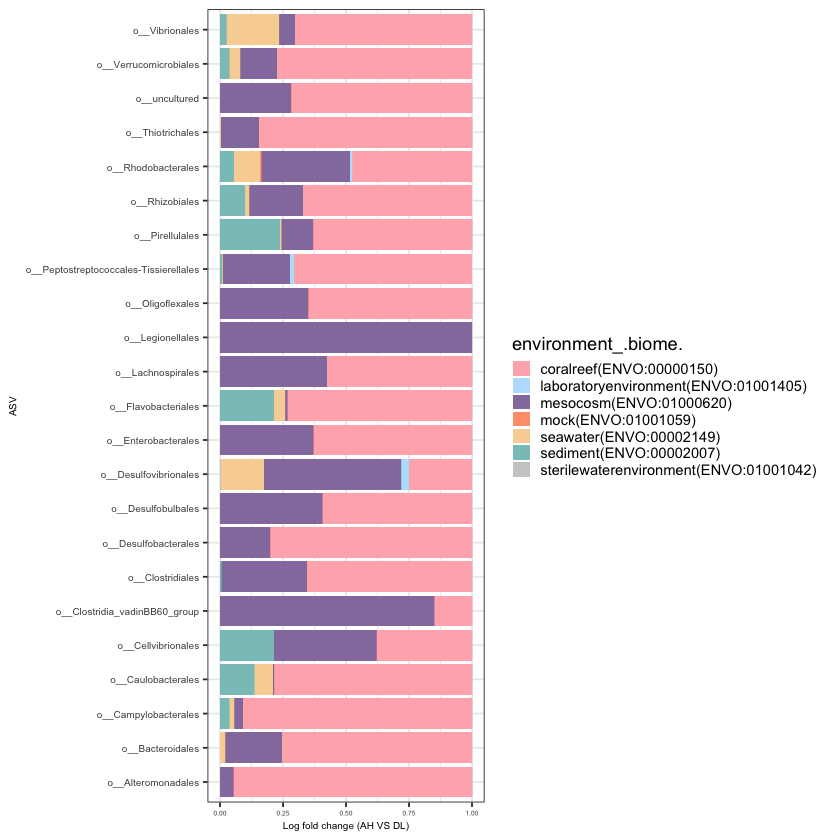

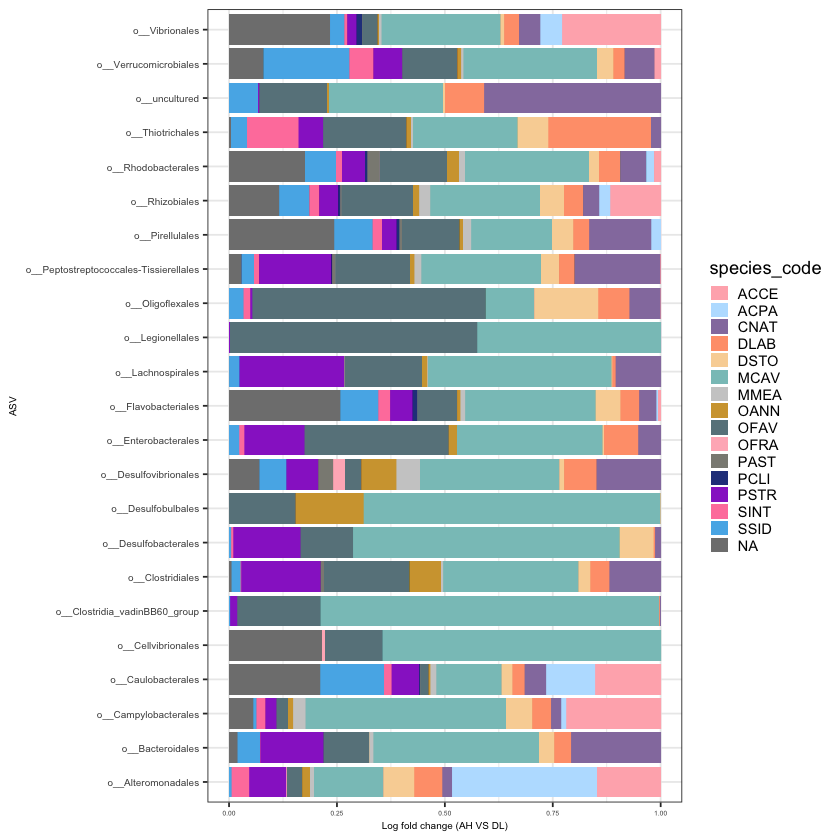

In [16]:
ggplot(data = ps_sigs_melt, 
           aes(x = Abundance, y = Order, fill=environment_.biome.)
              ) + 
 geom_bar(stat = "identity",position="fill") +
           #, position = position_(width = 0.3)) +
  theme_bw()  +
  
scale_fill_manual(values=c("#ffb3ba", "#bae1ff", "#957DAD", "lightsalmon",  
                           
                           "#F9D4A4", 
                            "#89C4C2",
                        
                           "gray80", 
                           "#D1A33D",
                           "lightblue4", "lightpink", "ivory4","royalblue4", "darkorchid", 
                           "palevioletred1", "#56B4E9","#CBD588","yellow2","#5F7FC7", "orange","#DA5724",
                            "gray80",
                           "#AD6F3B", "#673770")) +
  labs(y = "ASV", x = "Log fold change (AH VS DL)") + 
theme(strip.background = element_rect(fill="white")) +
theme(axis.title.x = element_text(size = 6)) +
theme(axis.title.y = element_text(size = 6)) +
theme(axis.text.y = element_text(size =6)) +
theme(axis.text.x = element_text(size =4)) +
theme(strip.text.x = element_text(size =8)) +
#theme(axis.text.y=element_blank()) +
guides(fill = guide_legend(keywidth = 0.8, keyheight =.70, ncol=1))



ggplot(data = ps_sigs_melt, 
           aes(x = Abundance, y = Order, fill=species_code)
              ) + 
 geom_bar(stat = "identity",position="fill") +
           #, position = position_(width = 0.3)) +
  theme_bw()  +
  
scale_fill_manual(values=c("#ffb3ba", "#bae1ff", "#957DAD", "lightsalmon",  
                           
                           "#F9D4A4", 
                            "#89C4C2",
                        
                           "gray80", 
                           "#D1A33D",
                           "lightblue4", "lightpink", "ivory4","royalblue4", "darkorchid", 
                           "palevioletred1", "#56B4E9","#CBD588","yellow2","#5F7FC7", "orange","#DA5724",
                            "gray80",
                           "#AD6F3B", "#673770")) +
  labs(y = "ASV", x = "Log fold change (AH VS DL)") + 
theme(strip.background = element_rect(fill="white")) +
theme(axis.title.x = element_text(size = 6)) +
theme(axis.title.y = element_text(size = 6)) +
theme(axis.text.y = element_text(size =6)) +
theme(axis.text.x = element_text(size =4)) +
theme(strip.text.x = element_text(size =8)) +
#theme(axis.text.y=element_blank()) +
guides(fill = guide_legend(keywidth = 0.8, keyheight =.70, ncol=1))

Warning message:
“Removed 22256 rows containing missing values (position_stack).”


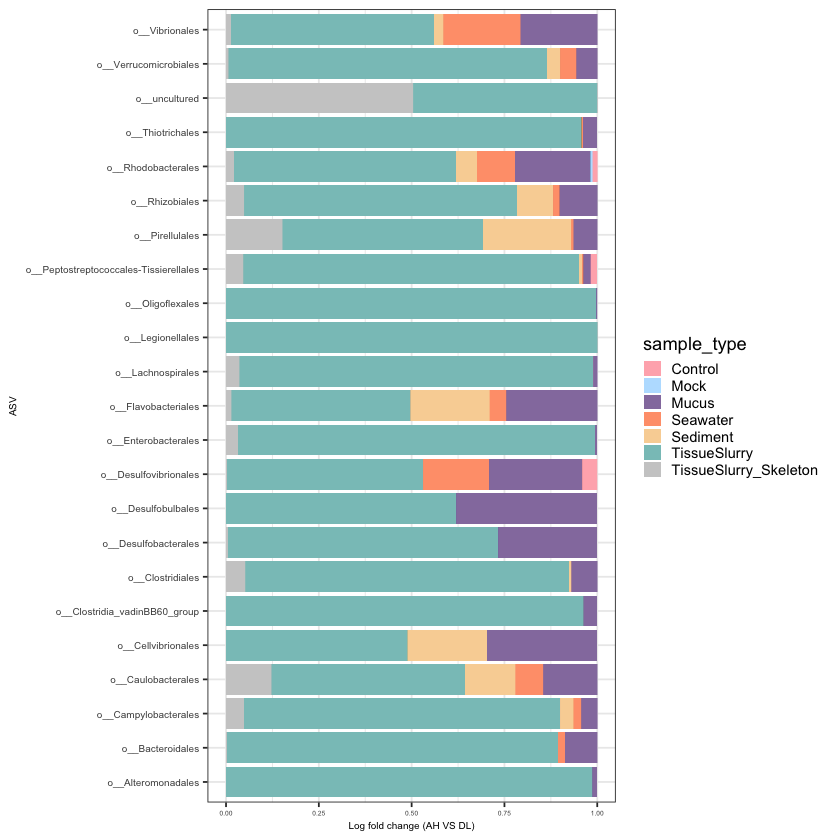

In [17]:
ggplot(data = ps_sigs_melt, 
           aes(x = Abundance, y = Order, fill=sample_type)
              ) + 
 geom_bar(stat = "identity",position="fill") +
           #, position = position_(width = 0.3)) +
  theme_bw()  +
  
scale_fill_manual(values=c("#ffb3ba", "#bae1ff", "#957DAD", "lightsalmon",  
                           
                           "#F9D4A4", 
                            "#89C4C2",
                        
                           "gray80", 
                           "#D1A33D",
                           "lightblue4", "lightpink", "ivory4","royalblue4", "darkorchid", 
                           "palevioletred1", "#56B4E9","#CBD588","yellow2","#5F7FC7", "orange","#DA5724",
                            "gray80",
                           "#AD6F3B", "#673770")) +
  labs(y = "ASV", x = "Log fold change (AH VS DL)") + 
theme(strip.background = element_rect(fill="white")) +
theme(axis.title.x = element_text(size = 6)) +
theme(axis.title.y = element_text(size = 6)) +
theme(axis.text.y = element_text(size =6)) +
theme(axis.text.x = element_text(size =4)) +
theme(strip.text.x = element_text(size =8)) +
#theme(axis.text.y=element_blank()) +
guides(fill = guide_legend(keywidth = 0.8, keyheight =.70, ncol=1))

Warning message:
“Removed 22256 rows containing missing values (position_stack).”


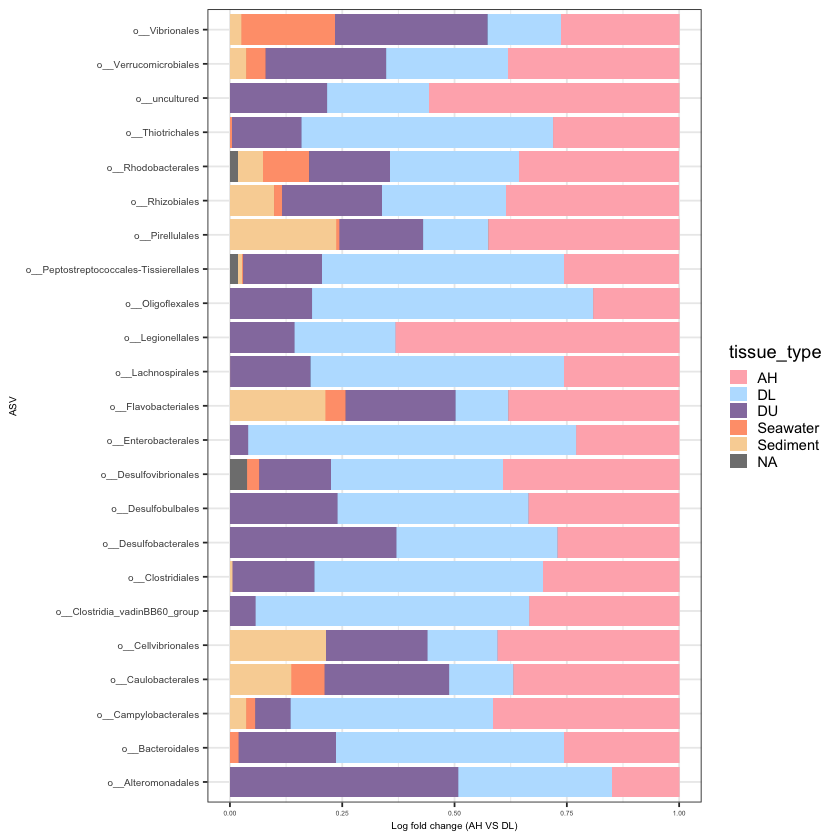

In [18]:
ggplot(data = ps_sigs_melt, 
           aes(x = Abundance, y = Order, fill=tissue_type)
              ) + 
 geom_bar(stat = "identity",position="fill") +
           #, position = position_(width = 0.3)) +
  theme_bw()  +
  
scale_fill_manual(values=c("#ffb3ba", "#bae1ff", "#957DAD", "lightsalmon",  
                           
                           "#F9D4A4", 
                            "#89C4C2",
                        
                           "gray80", 
                           "#D1A33D",
                           "lightblue4", "lightpink", "ivory4","royalblue4", "darkorchid", 
                           "palevioletred1", "#56B4E9","#CBD588","yellow2","#5F7FC7", "orange","#DA5724",
                            "gray80",
                           "#AD6F3B", "#673770")) +
  labs(y = "ASV", x = "Log fold change (AH VS DL)") + 
theme(strip.background = element_rect(fill="white")) +
theme(axis.title.x = element_text(size = 6)) +
theme(axis.title.y = element_text(size = 6)) +
theme(axis.text.y = element_text(size =6)) +
theme(axis.text.x = element_text(size =4)) +
theme(strip.text.x = element_text(size =8)) +
#theme(axis.text.y=element_blank()) +
#facet_grid(.~environment_.biome.) +
guides(fill = guide_legend(keywidth = 0.8, keyheight =.70, ncol=1))

In [19]:
tax_table(ps_sigs)

,Kingdom,Phylum,Class,Order,Family,Genus,Species,ASVs,Taxa
2eee8a7ea97e619aecbd2714c6f663ce,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Shimia,NA,ASV_33086,f__Rhodobacteraceae_ g__Shimia
30a063fc2165dd7deec8cb8addf109e6,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Flavobacteriales,f__Flavobacteriaceae,g__Actibacter,NA,ASV_34249,f__Flavobacteriaceae_ g__Actibacter
539e419fb3cbd047dae372ee7b9cc630,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhizobiales,f__Methyloligellaceae,g__uncultured,NA,ASV_58931,f__Methyloligellaceae_ g__uncultured
0583e9fb260de4b316e4074bbe4d8870,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,NA,NA,ASV_3981,f__Rhodobacteraceae_NA
aa79bae37ceb27417d305be0a142587b,d__Bacteria,p__Firmicutes,c__Clostridia,o__Peptostreptococcales-Tissierellales,f__Caminicellaceae,g__Paramaledivibacter,s__uncultured_bacterium,ASV_120529,f__Caminicellaceae_ g__Paramaledivibacter
86dbcbba6c57d3beb084182c8f520b60,d__Bacteria,p__Firmicutes,c__Clostridia,o__Peptostreptococcales-Tissierellales,f__Peptostreptococcaceae,g__uncultured,s__uncultured_bacterium,ASV_95088,f__Peptostreptococcaceae_ g__uncultured
429264bc3cd49d9c544f286870123eaa,d__Bacteria,p__Campilobacterota,c__Campylobacteria,o__Campylobacterales,f__Arcobacteraceae,g__Halarcobacter,s__uncultured_bacterium,ASV_46851,f__Arcobacteraceae_ g__Halarcobacter
16fff9acf48d3126728e7206546241ba,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Tropicibacter,NA,ASV_16284,f__Rhodobacteraceae_ g__Tropicibacter
411e8d46ae948548518a1f143013b9e4,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Maritimibacter,s__uncultured_bacterium,ASV_45812,f__Rhodobacteraceae_ g__Maritimibacter
4b274dc7aacaf15e22d9a605e460f0cb,d__Bacteria,p__Planctomycetota,c__Planctomycetes,o__Pirellulales,f__Pirellulaceae,g__Blastopirellula,s__uncultured_bacterium,ASV_52884,f__Pirellulaceae_ g__Blastopirellula


In [20]:
matrix_Asv <- as.matrix(data.frame(otu_table(ps_sigs)))

In [23]:
head(matrix_Asv)

,X100tiss_S31,X102tiss_S3,X104tiss_S32,X168eco_S8,X171eco_S9,X172eco_S10,X173eco_S11,X175eco_S12,X181eco_S14,X183eco_S15,⋯,X497,X498,X499,X5,X500,X6,X7,X8,X9,MC
ASV_33086,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ASV_34249,0,0,0,0,0,0,0,0,0,0,⋯,29,14,0,0,3,0,5,7,0,0
ASV_58931,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ASV_3981,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ASV_120529,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ASV_95088,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [21]:
ComplexHeatmap::pheatmap(matrix_Asv)

`use_raster` is automatically set to TRUE for a matrix with more than
2000 columns You can control `use_raster` argument by explicitly
setting TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

Warning message in grSoftVersion():
“unable to load shared object '/Library/Frameworks/R.framework/Resources/modules//R_X11.so':
  dlopen(/Library/Frameworks/R.framework/Resources/modules//R_X11.so, 6): Library not loaded: /opt/X11/lib/libSM.6.dylib
  Referenced from: /Library/Frameworks/R.framework/Versions/4.0/Resources/modules/R_X11.so
  Reason: image not found”
Warning message in cairoVersion():
“unable to load shared object '/Library/Frameworks/R.framework/Resources/library/grDevices/libs//cairo.so':
  dlopen(/Library/Frameworks/R.framework/Resources/library/grDevices/libs//cairo.so, 6): Library not loaded: /opt/X11/lib/libXrender.1.dylib
  Referenced from: /Library/Frameworks/R.framework/Versions/4.0/Resources/library/grDevices/libs/cairo.so
  Reason: image not foun

In [22]:
matrix_Asv <- as.matrix(data.frame(otu_table(ps_sigs)))
rownames(matrix_Asv) <- as.character(tax_table(ps_sigs)[, "ASVs"])
metadata_sub <- data.frame(sample_data(ps_sigs))
# Define the annotation color for columns and rows
annotation_col = data.frame(
    Subject = as.factor(metadata_sub$tissue_type), 
    `Body site` = as.factor(metadata_sub$species_code), 
    check.names = FALSE
)
rownames(annotation_col) = rownames(metadata_sub)

annotation_row = data.frame(
    Phylum = as.factor(tax_table(ps_sigs)[, "Phylum"])
)
rownames(annotation_row) = rownames(matrix_Asv)

# ann_color should be named vectors
phylum_col = RColorBrewer::brewer.pal(length(levels(annotation_row$Phylum)), "Paired")
names(phylum_col) = levels(annotation_row$Phylum)
ann_colors = list(
    Subject = c(`subject-1` = "red", `subject-2` = "blue"),
    `Body site` = c(`gut` = "purple", tongue = "yellow"),
    Phylum = phylum_col
)
ComplexHeatmap::pheatmap(matrix_Asv, scale= "row", 
                         annotation_col = annotation_col, 
                         annotation_row = annotation_row, 
                         annotation_colors = ann_colors,
                        border_color = NA)


`use_raster` is automatically set to TRUE for a matrix with more than
2000 columns You can control `use_raster` argument by explicitly
setting TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

Warning message in (function (filename = "Rplot%03d.png", width = 480, height = 480, :
“failed to load cairo DLL”
ERROR while rich displaying an object: Error in magick_image_readpath(path, density, depth, strip, defines): R: UnableToOpenBlob `/var/folders/j4/j37z3nw57wl5490t5t1rhk7h4k4czw/T//RtmpuN4Rdq/.heatmap_body_455ed3f7aff9d8d0c92266c9de67e33f_1_1aa303b37419a.png': No such file or directory @ error/blob.c/OpenBlob/2924

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2